In [1]:
from visual_genome.local import VisualGenome
import pandas as pd
import random

### Loading the data

The data is loaded from the `json` files located in the `data/` directory. It may take a few minutes to load the data. Please make sure to run `setup.py` first to get all necessary `json` files.

In [2]:
vg = VisualGenome() # this may take 2-3 minutes

Loading data...
Data loaded.


### Image Retrieval and Visualization

We can sample an `Image` object from the data and visualize it, or we can directly visualize a random image.


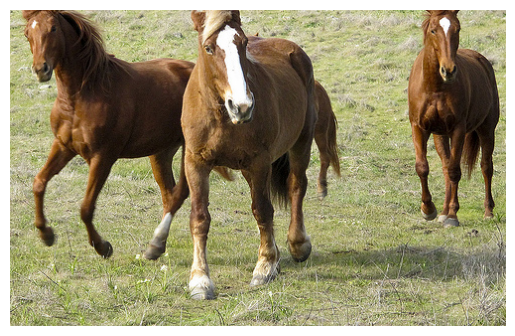

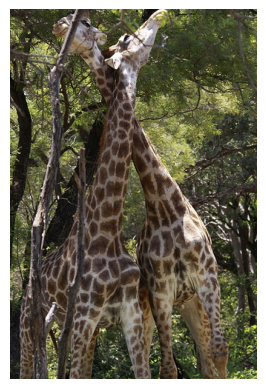

In [3]:
img = vg.sample_images() # sample single image - returns an IMAGE object (you can also sample a list of images by passing a number as an argument)
vg.display_image(img)

## or directly visualize a random image
vg.display_random_image()

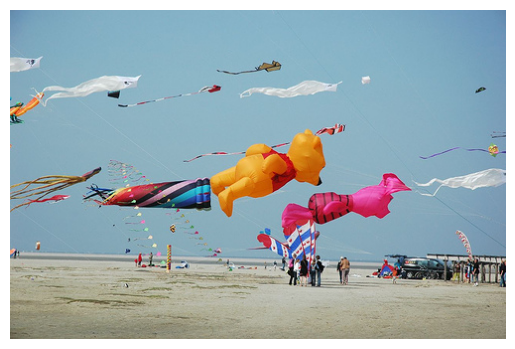

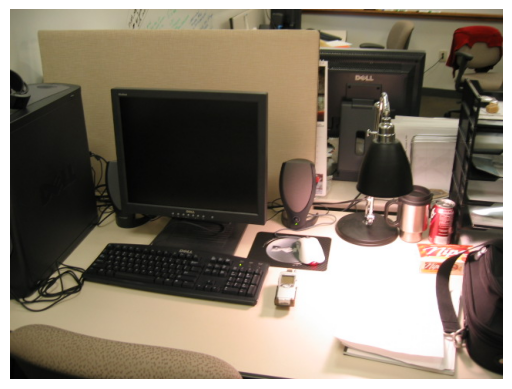

In [4]:
# You can sample an image ID as well
id = vg.sample_image_id()
vg.display_image(id)

# If you want, you can sample from a specific interval
id = vg.sample_image_id(start = 0, end = 1000)
vg.display_image(id)

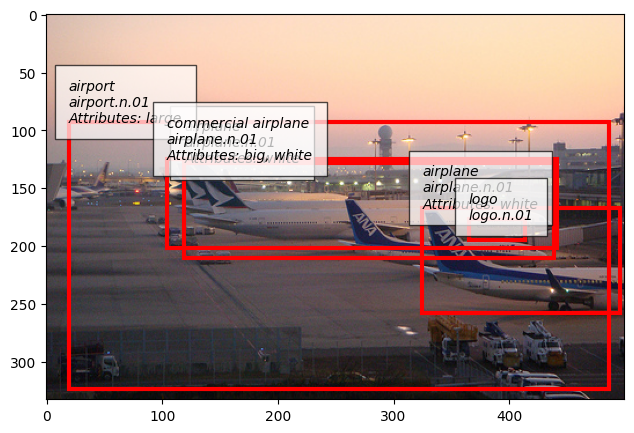

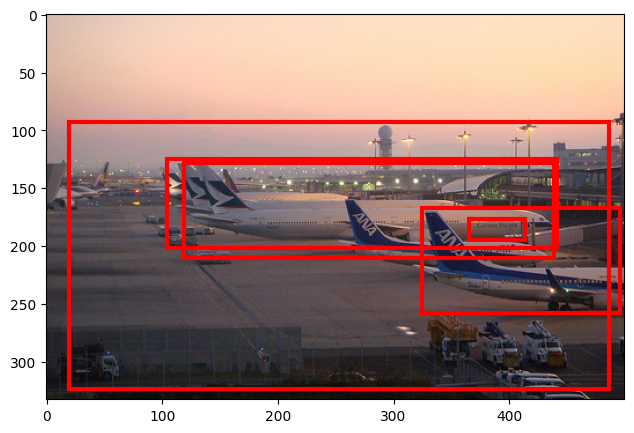

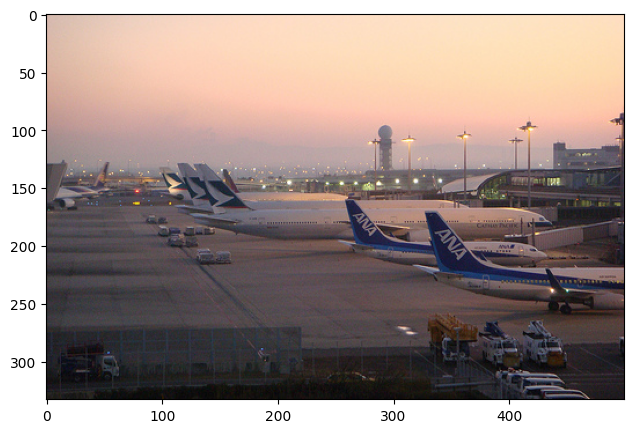

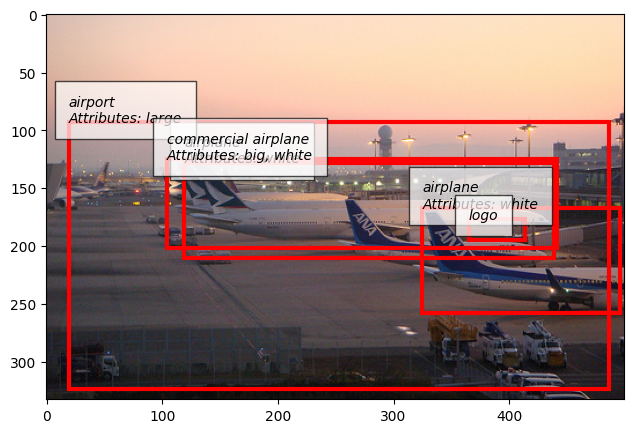

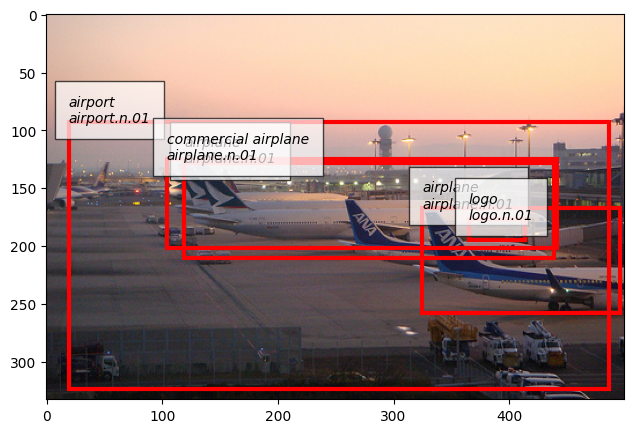

In [5]:
id = vg.sample_image_id()

# you can visualize the objects in an image, second parameter specifies the number of regions to visualize (avoid using large numbers for visibility)
vg.visualize_objects(id, 5)
# visualize without any description
vg.visualize_objects(id, 5, desc=False)
# visualize without objects
vg.visualize_objects(id, 0) # same as display_image(2408156)
# visualize without synsets
vg.visualize_objects(id, 5, synsets=False)
# visualize without attributes
vg.visualize_objects(id, 5, attributes=False)

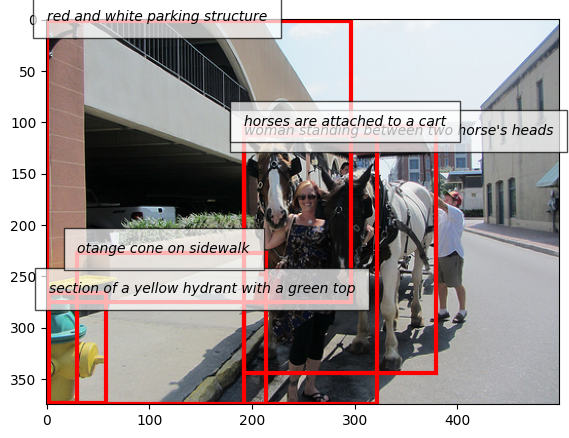

In [6]:
id = vg.sample_image_id()

# You can visualize regions as well, second parameter specifies the number of regions to visualize (avoid using large numbers for visibility)
vg.visualize_regions(id, 5)

### Scene Graph Generation

To visualize a scene graph, first we should call `generate_scene_graph_json` with the id of the image we want to visualize. It returns a `json` object that contains the scene graph of the image. Then we store the `json` object in the `graphviz` folder and call `graphviz/visualize_scene_graph.py` to render the scene graph.

In [3]:
id = vg.sample_image_id()
scene_graph = vg.generate_scene_graph_json(1)

import json
# save to graph.json
with open(f"graphviz/scene_graph.json", "w") as f:
    json.dump(scene_graph, f)

Now, generated scene graph is stored as a `json` file in the `graphviz` directory. You can visualize the scene graph by running the following code.

```bash
python graphviz/visualize_scene_graph.py
```


### Cluster Visualization

After running `clustering.ipynb`, two `csv` files are generated:

1. **First CSV**: Contains the following fields:
   - `Image_id`: The ID of the image.
   - `cluster`: The assigned cluster for the image.
   - `region_sentences`: Descriptive sentences for the image's regions.
   - `embeddings`: Feature embeddings for the image.
   - `centroid`: The cluster's centroid coordinates.
   - `distance_from_centroid`: The distance of the image's embedding from its assigned cluster centroid.

2. **Second CSV**: Includes only the `Image_id` and the corresponding `cluster`.

Using the second CSV file, you can visualize sample images from a specific cluster side by side.
 

In [4]:
csv_file = "categories_all-mpnet-base-v2_30clusters_simple.csv" # this is an example file, please change it according to yours

df = pd.read_csv(csv_file)
df.head()

,Image_id,cluster
0,2392778,24
1,2350124,7
2,2331619,21
3,1568,25
4,2351423,27


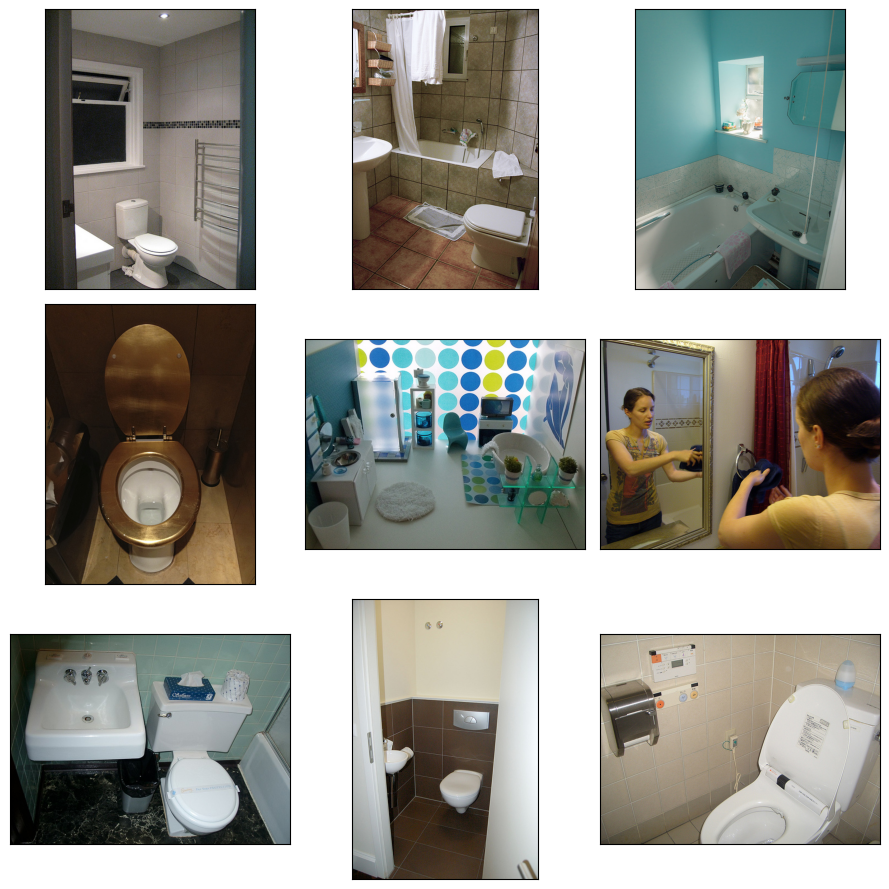

In [5]:
vg.visualize_cluster(df = df, cluster = 0, n = 3) # visualizes n x n grid of images from the given cluster

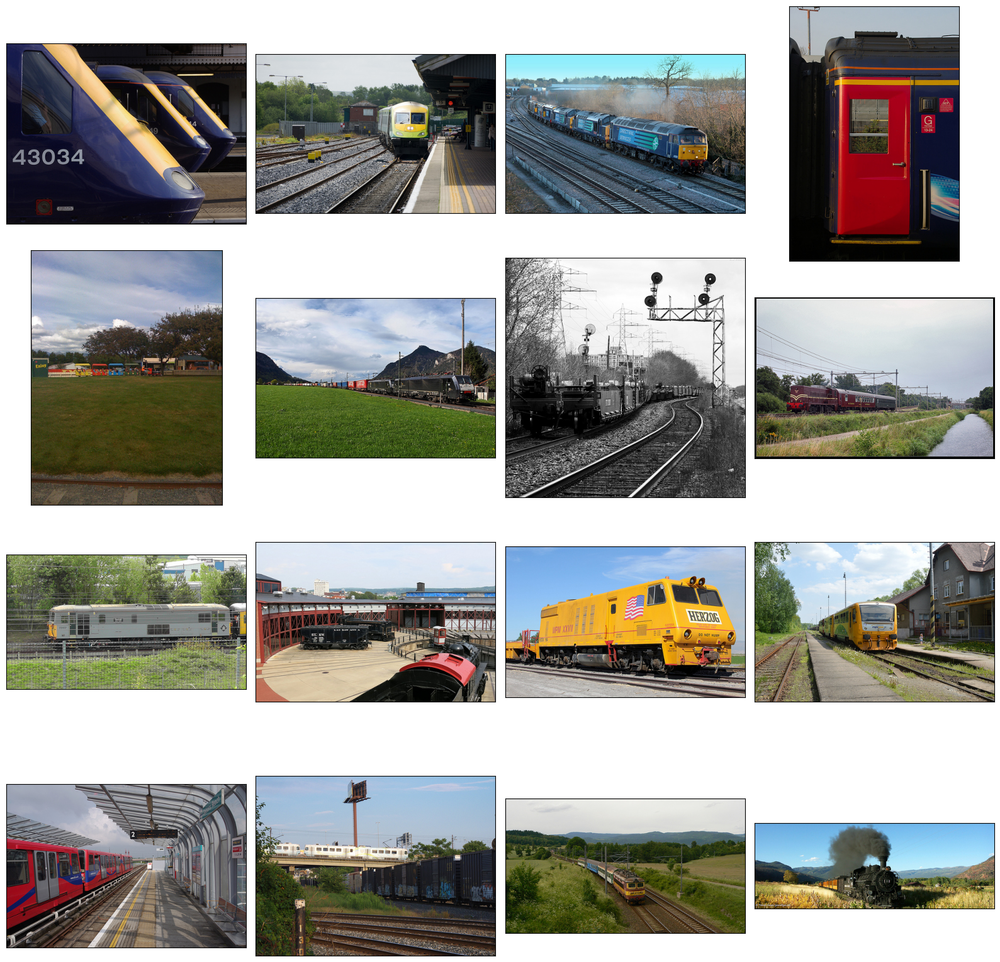

In [6]:
vg.visualize_cluster(df = df, cluster = 7, n = 4)

### Case
* Select a random cluster.
* Randomly sample an image from the cluster.
* Visualize the image.
* Print the statistics of the image.
* Generate the scene graph of the image.
* Generate a histogram of number of objects for that cluster.

Cluster:  1


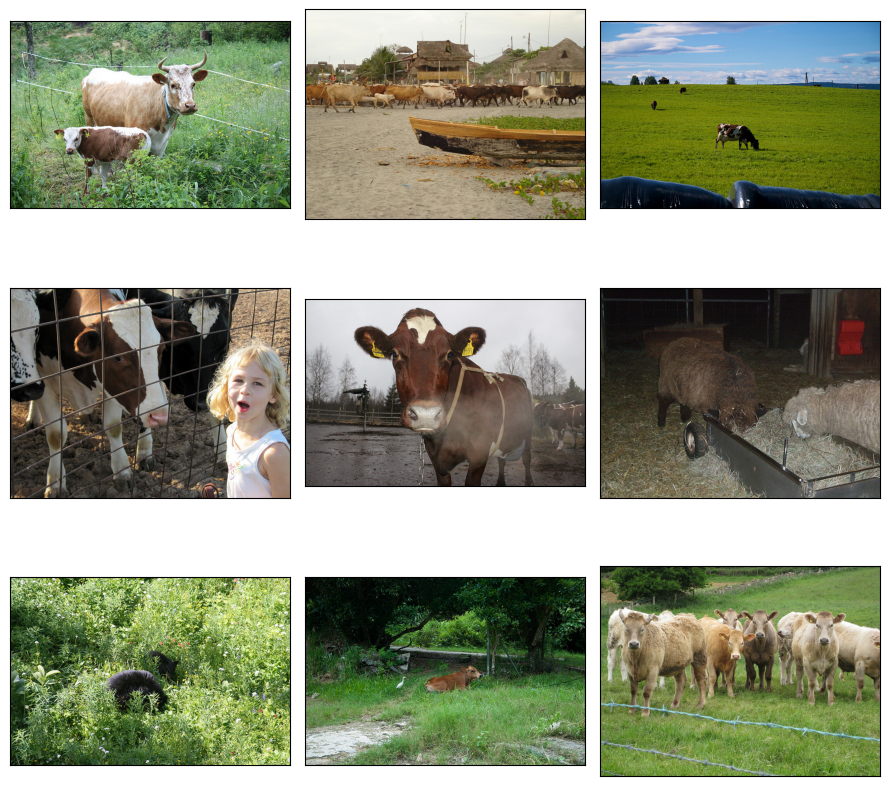

Image ID:  2342285


In [7]:
# get cluster field of df
clusters = df["cluster"].unique()

# sample a cluster
cluster = random.choice(clusters)
print("Cluster: ", cluster)

# visualize the cluster
vg.visualize_cluster(df = df, cluster = cluster, n = 3)

# get images from that clsuter
images = df[df["cluster"] == cluster]["Image_id"].values

# sample an image
image = random.choice(images)
print("Image ID: ", image)

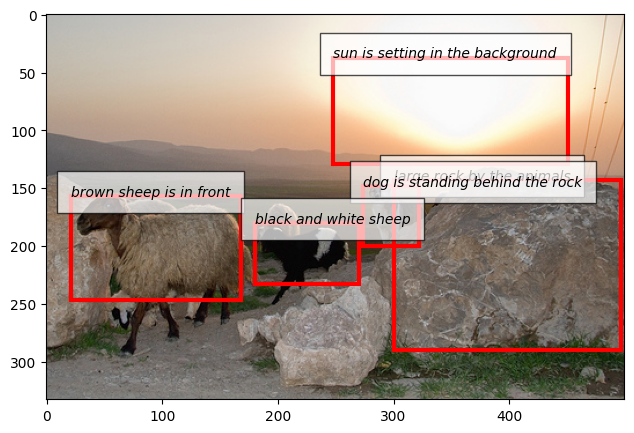

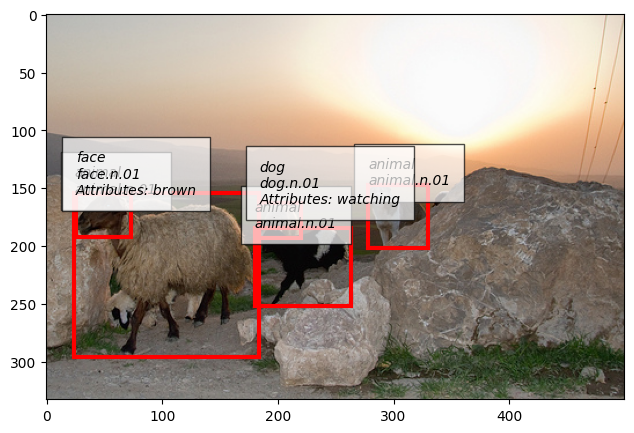

In [8]:
# visualize the image with region descriptions
vg.visualize_regions(image, 5)

# visualize the image with objects
vg.visualize_objects(image, 5)

In [9]:
stats = vg.get_statistics_for_image(image)
print("Statistics for Image:\n",)

import json
print(json.dumps(stats, indent=4))

Statistics for Image:

{
    "# of objects": 15,
    "# of attributes": 9,
    "# of relationships": 10,
    "vertices to node ratio": "0.85",
    "# of unique objects": 9,
    "# of unique attributes": 5,
    "# of unique relationships": 3,
    "# of objects with missing synsets": 0,
    "# of attributes with missing synsets": 4,
    "# of relationships with missing synsets": 0
}


In [10]:
scene_graph = vg.generate_scene_graph_json(image)

import json
# save to graph.json
with open(f"graphviz/scene_graph.json", "w") as f:
    json.dump(scene_graph, f)

# run the following command to visualize the scene graph
# python graphviz/visualize_scene_graph.py

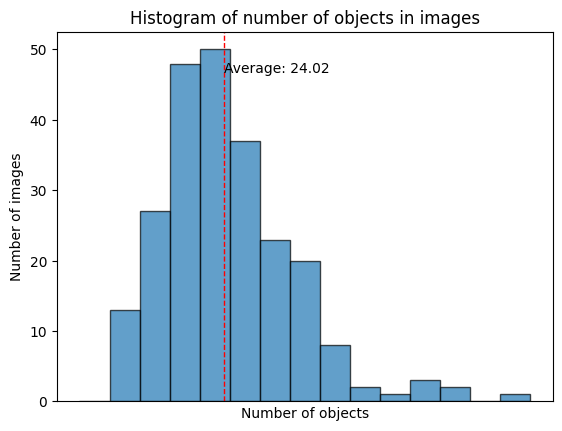

In [11]:
vg.histogram("objects", images)